## 3.1.1.Noise Detection and Filtering 부분 부터 이해할 것

In [1]:
ParaFolder = 'VitalDB_ART'

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re
import time
from scipy import signal 
if 'ParaFolder' not in locals():
    print('ParaFolder No exist') 

# 3.1.1..Map Calculation and Hypotention Detection
#### MAP 계산 및 저혈압 구간 탐지
이론적으로는 65보다 낮은 MAP이 1분이상 지속될 때를 저혈압으로 정의
<br> Smoothing으로 부터 발생하는 에러를 상쇄하기 위해 MAP의 임계값을 하향 조절할(예:64.5) 필요성 있음

In [19]:
DataSmoothed = np.load('./ProcessedData/'+ParaFolder+'/RawSet1/DataSmoothed.npy',allow_pickle = True)
PeakIDSet = np.load('./ProcessedData/'+ParaFolder+'/RawSet1/PeakIDSet.npy',allow_pickle=True)
ValleyIDSet = np.load('./ProcessedData/'+ParaFolder+'/RawSet1/ValleyIDSet.npy',allow_pickle=True)

In [20]:
DataSmoothed.shape, PeakIDSet.shape, ValleyIDSet.shape

((3806,), (3806,), (3806,))

### Noise detection moduels
#### Noise Detection 하기
- Logic: 
<br> ① Peak to Peak 동일한 길이(100)로 Scaling 하여 구간 설정하고, 구간 내 각각 샘플의 평균값으로부터 오차 5% 이상 되는 Peak 찾기 
<br> ② peak 및 valley에서 N구간(P2PSize)의 평균(Peak / Valley) 값보다 M%(FilterRate)만큼 벗어난 값을 최종 noise로 선정

- Hyper-parameter
<br> - FilterRate: 에러허용 범위(에러 허용범위 낮을 수록 데이터 순결도가 높아지지만 Sample 수가 적어짐)
<br> - P2PSize: 로직 계산시 고려할 peak 및 valley 구간 사이즈 

In [21]:
#FilterRate = 0.15
P2PSize = 20

def FindIDX(IDSet, endIDX):
    IDxSel =  np.where( (IDSet>=startIDX) & (IDSet<=endIDX ))[0]

    if IDSet[IDxSel][-1] < endIDX:
        IDX = IDSet[IDxSel]
    else:
        IDX = IDSet[IDxSel][:-1]
    return IDX


def UnitError(FeatInterval, FeatIDX, FilterRate): 
    # Peak to Peak 동일한 길이(100)로 Scaling 하여 구간 설정하고, 
    # 구간 내 각각 샘플의 평균값으로부터 오차 5% 이상 되는 Peak 찾기

    # P2PSize 변수는 상위 스코프에서 정의되어야 함을 가정
    # FeatIDX가 충분히 큰지 확인하는 로직 필요

    # 20 Feat 기준
    FeatIdxVec = np.arange(0, FeatIDX.shape[0] - (P2PSize + 1))[..., np.newaxis]
    FeatIdxVec = np.tile(FeatIdxVec, (P2PSize + 1))
    FeatIdxVec += np.arange(0, (P2PSize + 1))
    FeatIdxVec = FeatIDX[1:][FeatIdxVec]  # 처음 peak/valley interval 관련 noise detection 제외

    IntervalIDX = np.concatenate([FeatIdxVec[:, :-1][..., np.newaxis], FeatIdxVec[:, 1:][..., np.newaxis]], axis=-1) 

    ## Feat to Feat Scaling : resampling 100 size per each case
    caseList = []
    for cases in IntervalIDX:
        subcaseList = []
        for subcase in cases:
            # signal.resample의 결과가 2차원 배열로 반환되므로, 첫 번째 요소만을 리스트에 추가합니다.
            resampled_data = signal.resample(FeatInterval[subcase[0]:subcase[1]], 100)
            if resampled_data.ndim > 1:
                # 2차원 배열의 경우 첫 번째 요소를 선택합니다.
                resampled_data = resampled_data[:, 0]
            subcaseList.append(resampled_data)
        caseList.append(subcaseList)

    # caseList의 정확한 구성 확인
    if not caseList or not any(subcaseList for subcaseList in caseList):
        # caseList가 비어 있거나 모든 subcaseList가 비어 있으면
        print("caseList is empty or improperly formed")
        return np.array([])  # 빈 넘파이 배열을 반환합니다.

    # caseList를 넘파이 배열로 변환합니다.
    ResampleDataSet = np.array(caseList)

    # 변환된 배열의 차원을 확인합니다.
    if ResampleDataSet.ndim == 3:
        # 차원이 정확하면 마지막 차원을 선택합니다.
        ResampleDataSet = ResampleDataSet[:, :, 0]
    else:
        # 차원이 정확하지 않으면 오류 메시지를 출력하고 빈 배열을 반환합니다.
        print("ResampleDataSet does not have the expected number of dimensions:", ResampleDataSet.ndim)
        return np.array([])

    ## 평균 비교
    MeanResampleDataSet = np.mean(ResampleDataSet, axis=1, keepdims=True)
    ABSErrors = np.abs(ResampleDataSet - MeanResampleDataSet)
    GreatErrorsIDX = np.where(ABSErrors > MeanResampleDataSet * FilterRate)

    ## NOISE 후보구간이 있을 경우만 후보 Feat(peak or valley) 선택
    NoiseCandiFeat = np.array([])
    if len(GreatErrorsIDX[0]) > 0:
        NoiseCandiFeat = np.unique(IntervalIDX[GreatErrorsIDX[0], GreatErrorsIDX[1]])[..., np.newaxis]

    return NoiseCandiFeat

def FeatDiffError (FeatInterval,PeakIDX,ValleyIDX, NoiseCandiPeak,NoiseCandiValley, FilterRate): # peak 및 valley에서 20구간의 평균(Peak / Valley) 값보다 5% 벗어난 값을 최종 noise로 선정
    # ValleyIDX 와 NoiseCandiValley의 관계 map
    ValleyIDXMap = np.where(np.in1d(ValleyIDX, NoiseCandiValley))[0]
    PeakIDXMap = np.where(np.in1d(PeakIDX, NoiseCandiPeak))[0]

    # noise 후보군 peak id 기준으로 이후 27개의 peak
    ## 6000 / 50 (cycle) = 120 bpm, 6000 / 150 (cycle) = 40 bpm 
    ## ((100*20 / 150) + (100*20 / 50) )/2 = 27 
    PeakAVGIDX = np.tile(PeakIDXMap[..., np.newaxis], 20) + np.arange(0, 20)
    PeakAVGIDX = np.minimum(PeakAVGIDX,PeakIDX.shape[0]-1)
    PeakAVGTest = FeatInterval[PeakIDX[PeakAVGIDX]][:,:,0]
    ABSPeakDiff = np.abs(PeakAVGTest[:, 1:] - PeakAVGTest[:, :-1]) 
    ABSPeakDiff = np.concatenate([np.zeros((ABSPeakDiff.shape[0], 1)), ABSPeakDiff], axis=-1)

    # 20개 peak 구간 평균의 5% 의 크기보다 평균에서 벗어난 peak
    CuttPeakNoise =  np.mean(PeakAVGTest, axis=-1)[..., np.newaxis]*FilterRate
    PeakAVGIDX_pad = PeakAVGIDX * (ABSPeakDiff>CuttPeakNoise).astype('int')
    PeakAVGIDX_pad = np.unique(PeakAVGIDX_pad)

    if len(PeakIDX[PeakAVGIDX_pad])>0: # Index zero 처리, candidate 되지 않았다면 0 삭제
        if len(np.intersect1d(NoiseCandiPeak, PeakIDX[PeakAVGIDX_pad][0])) == 0:
            PeakAVGIDX_pad = PeakAVGIDX_pad[1:]
    AnomalyPeakIDX = PeakIDX[PeakAVGIDX_pad]

    # noise 후보군 Valley id 기준으로 이후 20개의 Valley
    ValleyAVGIDX = np.tile(ValleyIDXMap[..., np.newaxis], 20) + np.arange(0, 20)
    ValleyAVGIDX = np.minimum(ValleyAVGIDX,ValleyIDX.shape[0]-1)
    ValleyAVGTest = FeatInterval[ValleyIDX[ValleyAVGIDX]][:,:,0]
    ABSValleyDiff = np.abs(ValleyAVGTest[:, 1:] - ValleyAVGTest[:, :-1]) 
    ABSValleyDiff = np.concatenate([np.zeros((ABSValleyDiff.shape[0], 1)),ABSValleyDiff], axis=-1)

    # 20개 Valley 구간 평균의 5% 의 크기보다 평균에서 벗어난 Valley
    CuttValleyNoise =  np.mean(ValleyAVGTest, axis=-1)[..., np.newaxis]*FilterRate
    ValleyAVGIDX_pad = ValleyAVGIDX * (ABSValleyDiff>CuttValleyNoise).astype('int')
    ValleyAVGIDX_pad = np.unique(ValleyAVGIDX_pad)

    if len(ValleyIDX[ValleyAVGIDX_pad])>0: # Index zero 처리, candidate 되지 않았다면 0 삭제
        if len(np.intersect1d(NoiseCandiValley, ValleyIDX[ValleyAVGIDX_pad][0])) == 0:
            ValleyAVGIDX_pad = ValleyAVGIDX_pad[1:]
    AnomalyValleyIDX = ValleyIDX[ValleyAVGIDX_pad]

    # 최종 Noise idx
    AnomalyIDX =  np.sort(np.concatenate([AnomalyPeakIDX, AnomalyValleyIDX]))
    return AnomalyIDX

###  수집 프로세싱
#### DataSmoothed, PeakIDSet, ValleyIDSet 가 이미 존재하여야함

In [ ]:
TarFilterRate = 0.05
InpFilterRate = 0.20

SkipLen = 15 * 60 * 100 + (90*100)  # 15분 + input 90초 
MaxPerSamp = 10 # 한 sample 당 최대 몇개까지 무작위 추출할지 수 

Yraw = []
Ylabel = []
Ylabel2 = []
Xinput = []
Xlabel = []

Count = 0
for inum, SubData in enumerate(DataSmoothed[0:]):

    print(inum)
    
    PeakIDX = PeakIDSet[inum] # PeakIDset List에서 해당 Peak ID만 선택
    ValleyIDX = ValleyIDSet[inum] # ValleyIDSet List에서 해당 Valley ID만 선택
    
    TargetInterval =  SubData[SkipLen:]

    
    ####------ ------ ------ 무작위 구간 선택 ------ ------ ------####
    if TargetInterval.shape[0] < 2 * 60 * 100: # target 구간이 2분 미만인 경우 제외
        print('target 구간이 2분 미만')
        continue;

    
    Count += 1
    
    # 무작위로 target 구간을 n개 선택할 때, 시작과 끝의 상한하한 점 선택
    UpperLimit = SubData.shape[0] - 61 * 100
    LowerLimit = 17*60*100 # 15분(skip 구간) + 1분30초(투입길이) 보다 넉넉한 candidate 구간

    if LowerLimit >= UpperLimit:
        print('짧은 신호')
        continue;
    
    TargetStartIDX = np.random.randint(LowerLimit, UpperLimit, MaxPerSamp)
    TargetEndIDX = TargetStartIDX + 60 * 100

    for TarStart,TarEnd in zip(TargetStartIDX,TargetEndIDX ):

        # Target 구간
        TargetValleyIDX = ValleyIDX[(ValleyIDX >= TarStart) & (ValleyIDX <= TarEnd)]
        TargetPeakIDX =PeakIDX[(PeakIDX >= TarStart) & (PeakIDX <= TarEnd)]

        # Inp 구간
        InpEnd = TarStart - 15 * 60 * 100 # 15분
        InpStart = InpEnd - 90 * 100 # 90초
        InpValleyIDX = ValleyIDX[(ValleyIDX >= InpStart) & (ValleyIDX <= InpEnd)]
        InpPeakIDX =PeakIDX[(PeakIDX >= InpStart) & (PeakIDX <= InpEnd)]

        if len(SubData[InpStart:InpEnd]) != 9000:
            print('Short in Inp length')
            continue;
    
        
        # Target 구간이 반드시 clean 해야 저혈압 labeling 신뢰성 있음
        TarNoiseCandiPeak = UnitError(SubData,TargetPeakIDX, TarFilterRate ) # Noise 후보 peak
        TarNoiseCandiValley = UnitError(SubData,TargetValleyIDX, TarFilterRate ) # Noise 후보 valley
        TarAnomalyIDList = FeatDiffError(SubData,TargetPeakIDX, TargetValleyIDX, TarNoiseCandiPeak, TarNoiseCandiValley, TarFilterRate)  # peak / valley 20 구간의 error를 통한 noise detection

        Yraw.append(SubData[TarStart:TarEnd])

        ####------ ------ ------ MAP 계산  및 저혈압 레이블링 ------ ------ ------####
        '''
        # 저혈압을 정의하는 target 구간에 노이즈가 있는 경우, MAP 계산 skip
        if  len(TarAnomalyIDList) > 0:
            print('노이즈로 인한 저혈압 판별 불가')
            continue;
        '''
        if  len(TarAnomalyIDList) > 0:
            Ylabel2.append('NoisTar')
        else:
            Ylabel2.append('CleanTar')
            
        
        if TargetPeakIDX.shape[0] > TargetValleyIDX.shape[0]:
            TargetPeakIDX = TargetPeakIDX[:-1]
        elif TargetValleyIDX.shape[0] > TargetPeakIDX.shape[0]:
            TargetValleyIDX = TargetValleyIDX[:-1]
           
        if TargetPeakIDX.size > 0 and TargetValleyIDX.size > 0:
            # 피크가 밸리보다 뒤에 있는 경우를 확인합니다.
            if TargetPeakIDX[1:][0] > TargetValleyIDX[1:][0]: 
                # Boundary에 있는 피크와 밸리를 제외하고 MAPset을 생성합니다.
                MAPset = np.concatenate([TargetPeakIDX[1:-1][:, np.newaxis], TargetValleyIDX[2:][:, np.newaxis]], axis=-1)
            else:
                MAPset = np.concatenate([TargetPeakIDX[1:][:, np.newaxis], TargetValleyIDX[1:][:, np.newaxis]], axis=-1)
            # 마지막 피크/밸리는 에러가 있을 수 있으므로 제외합니다.
            MAPset = MAPset[:-1]
        else:
            # 하나라도 배열이 비어 있다면, MAPset을 비어 있는 배열로 설정합니다.
            MAPset = np.array([])

        if MAPset.size > 0 and MAPset.ndim > 1:
            if np.min(MAPset[:, 1] - MAPset[:, 0]) < 0:
                print('error', inum)
                # 오류가 있는 경우의 추가적인 처리를 여기에 작성합니다.
        else:
            # MAPset이 비어 있거나 1차원 배열인 경우 오류를 피하기 위해 계산을 건너뜁니다.
            print('MAPset is empty or not a 2D array')
            
        '''for i in range(len(MAPset)):
            if MAPset[i, 0] >= MAPset[i, 1]:
                print(f"Ordering error at row {i}: Peak index {MAPset[i, 0]} is not less than Valley index {MAPset[i, 1]}")'''

       # Check if MAPset is not empty and is a 2-dimensional array
        if MAPset.size > 0 and MAPset.ndim == 2:
            # Check if each peak index is less than the corresponding valley index
            for i in range(MAPset.shape[0]):
                if MAPset[i, 0] >= MAPset[i, 1]:
                    print(f"Ordering error at row {i}: Peak index {MAPset[i, 0]} is not less than Valley index {MAPset[i, 1]}")

            # Calculate MAPValue only if MAPset is correctly formed
            MAPValue = (SubData[MAPset[:, 0]] + SubData[MAPset[:, 1]] * 2) / 3

            # Additional logic based on MAPValue...
        else:
            # Handle the case where MAPset is not a 2D array
            print('MAPset is not a 2D array or is empty')
        
        if np.sum(MAPValue<=65) / len(MAPValue) == 1 :
            Ylabel.append(['Hypo']) 
            print('Hypo')
        elif np.sum(MAPValue>=75) / len(MAPValue) == 1 :
            Ylabel.append(['NonHypo']) 
            print('NonHypo')
        else:
            Ylabel.append(['GrayZone']) 
            print('그레이존')

        ####------ ------ ------ 저혈압 Target 구간과 mapping 되는 input 구간 noise 판별 ------ ------ ------####
                
        InpNoiseCandiPeak = UnitError(SubData,InpPeakIDX, InpFilterRate ) # Noise 후보 peak
        InpNoiseCandiValley = UnitError(SubData,InpValleyIDX, InpFilterRate) # Noise 후보 valley
        InpAnomalyIDList = FeatDiffError(SubData,InpPeakIDX,InpValleyIDX, InpNoiseCandiPeak,InpNoiseCandiValley, InpFilterRate)  # peak / valley 20 구간의 error를 통한 noise detection

        Xinput.append(SubData[InpStart:InpEnd]) 

        if len(InpAnomalyIDList) > 0:
            Xlabel.append('NoisInp')
        else:
            Xlabel.append('Clean')

0
target 구간이 2분 미만
1
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
그레이존
2
그레이존
그레이존
NonHypo
그레이존
그레이존
그레이존
그레이존
그레이존
NonHypo
그레이존
3
NonHypo
NonHypo
NonHypo
그레이존
NonHypo
NonHypo
그레이존
그레이존
그레이존
NonHypo
4
그레이존
그레이존
그레이존
그레이존
그레이존
NonHypo
그레이존
그레이존
그레이존
그레이존
5
NonHypo
NonHypo
그레이존
그레이존
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
그레이존
6
NonHypo
NonHypo
NonHypo
NonHypo
그레이존
그레이존
그레이존
NonHypo
그레이존
NonHypo
7
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
그레이존
NonHypo
NonHypo
NonHypo
8
그레이존
그레이존
그레이존
그레이존
그레이존
그레이존
그레이존
그레이존
그레이존
그레이존
9
그레이존
NonHypo
NonHypo
NonHypo
그레이존
NonHypo
그레이존
NonHypo
그레이존
그레이존
10
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
그레이존
NonHypo
11
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
NonHypo
그레이존
NonHypo
12
NonHypo
그레이존
그레이존
NonHypo
그레이존
NonHypo
NonHypo
그레이존
그레이존
NonHypo
13
그레이존
NonHypo
그레이존
그레이존
NonHypo
그레이존
NonHypo
NonHypo
NonHypo
NonHypo
14
그레이존
그레이존
그레이존
그레이존
NonHypo
그레이존
그레이존
NonHypo
Hypo
그레이존
15
NonHypo
NonHypo
그

In [ ]:
len(Yraw), len(Ylabel), len(Ylabel2), len(Xinput), len(Xlabel)

In [ ]:
np.save('./ProcessedData/'+ParaFolder+'/RawSet1/Yraw0.05.npy', Yraw)
np.save('./ProcessedData/'+ParaFolder+'/RawSet1/Ylabel0.05.npy', Ylabel)
np.save('./ProcessedData/'+ParaFolder+'/RawSet1/Ylabel20.05.npy', Ylabel2)
np.save('./ProcessedData/'+ParaFolder+'/RawSet1/Xinput0.05.npy', Xinput)
np.save('./ProcessedData/'+ParaFolder+'/RawSet1/Xlabel0.05.npy', Xlabel)

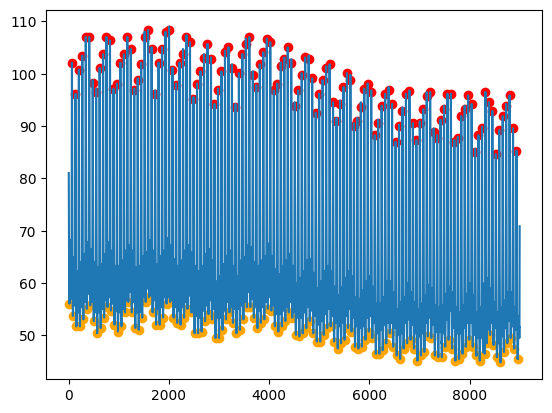

In [17]:
plt.plot(SubData[InpStart:InpEnd] )
plt.scatter(InpPeakIDX-InpStart, SubData[InpPeakIDX], c='red')
plt.scatter(InpValleyIDX-InpStart, SubData[InpValleyIDX], c='orange')

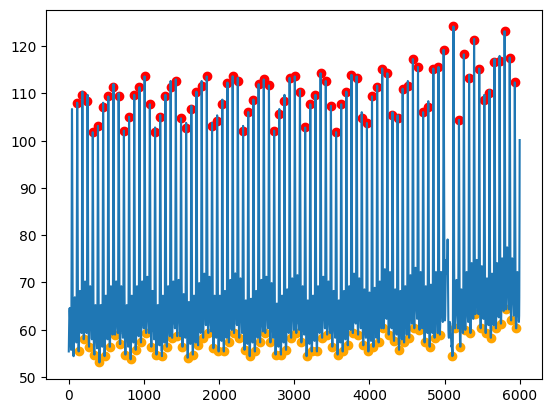

In [18]:
plt.plot(SubData[TarStart:TarEnd] )
plt.scatter(TargetPeakIDX-TarStart, SubData[TargetPeakIDX], c='red')
plt.scatter(TargetValleyIDX-TarStart, SubData[TargetValleyIDX], c='orange')

In [2]:
r1Yraw=np.load('./ProcessedData/VitalDB_ART/RawSet1/Yraw.npy', allow_pickle=True)
r1Ylabel=np.load('./ProcessedData/VitalDB_ART/RawSet1/Ylabel.npy', allow_pickle=True)
r1Ylabel2=np.load('./ProcessedData/VitalDB_ART/RawSet1/Ylabel2.npy', allow_pickle=True)
r1Xinput=np.load('./ProcessedData/VitalDB_ART/RawSet1/Xinput.npy', allow_pickle=True)
r1Xlabel=np.load('./ProcessedData/VitalDB_ART/RawSet1/Xlabel.npy', allow_pickle=True)

In [3]:
r2Yraw=np.load('./ProcessedData/VitalDB_ART/RawSet2/Yraw.npy', allow_pickle=True)
r2Ylabel=np.load('./ProcessedData/VitalDB_ART/RawSet2/Ylabel.npy', allow_pickle=True)
r2Ylabel2=np.load('./ProcessedData/VitalDB_ART/RawSet2/Ylabel2.npy', allow_pickle=True)
r2Xinput=np.load('./ProcessedData/VitalDB_ART/RawSet2/Xinput.npy', allow_pickle=True)
r2Xlabel=np.load('./ProcessedData/VitalDB_ART/RawSet2/Xlabel.npy', allow_pickle=True)

In [4]:
r3Yraw=np.load('./ProcessedData/VitalDB_ART/RawSet3/Yraw.npy', allow_pickle=True)
r3Ylabel=np.load('./ProcessedData/VitalDB_ART/RawSet3/Ylabel.npy', allow_pickle=True)
r3Ylabel2=np.load('./ProcessedData/VitalDB_ART/RawSet3/Ylabel2.npy', allow_pickle=True)
r3Xinput=np.load('./ProcessedData/VitalDB_ART/RawSet3/Xinput.npy', allow_pickle=True)
r3Xlabel=np.load('./ProcessedData/VitalDB_ART/RawSet3/Xlabel.npy', allow_pickle=True)

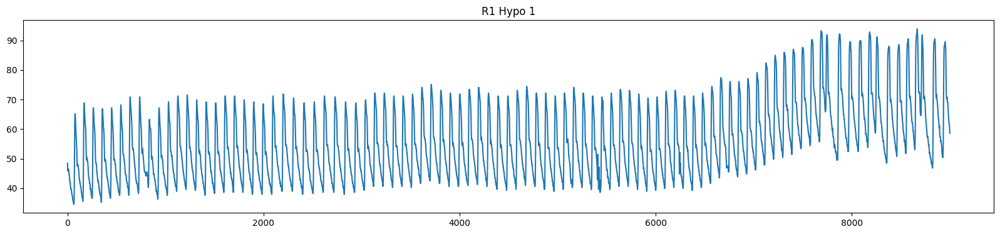

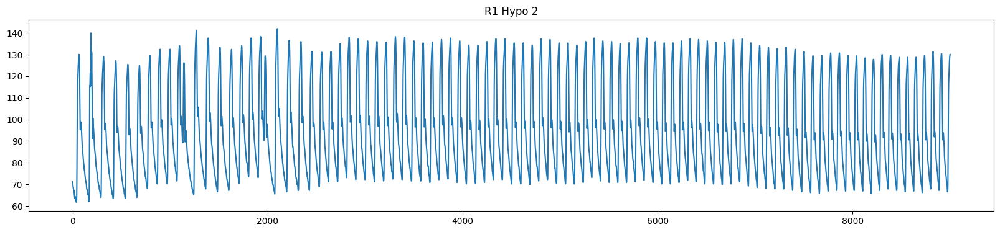

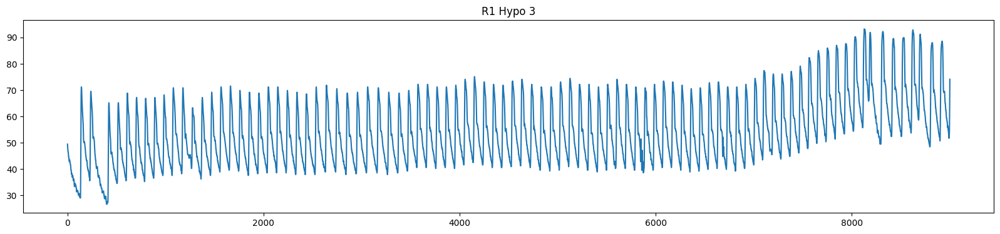

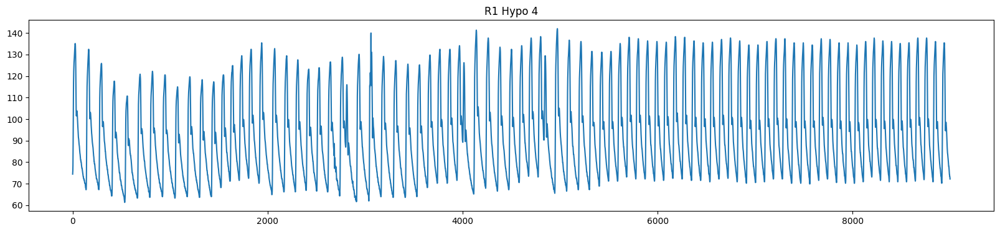

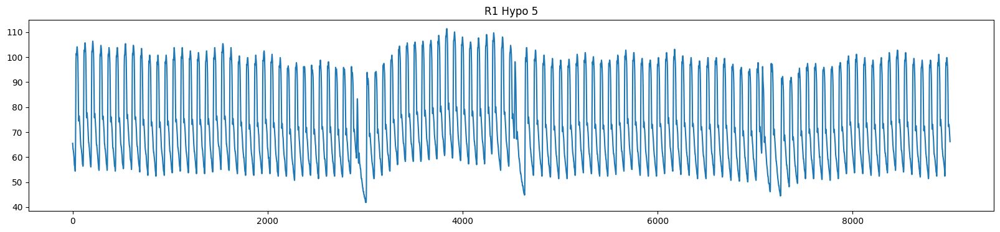

...

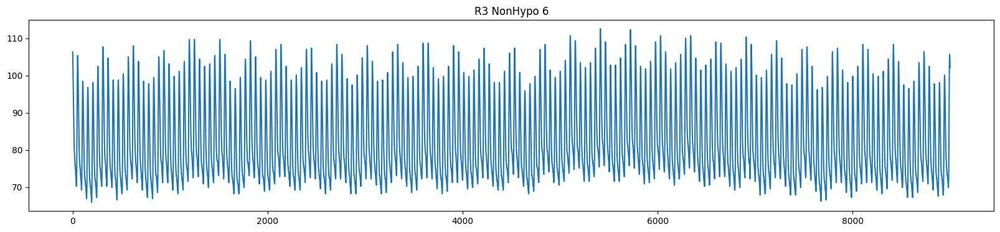

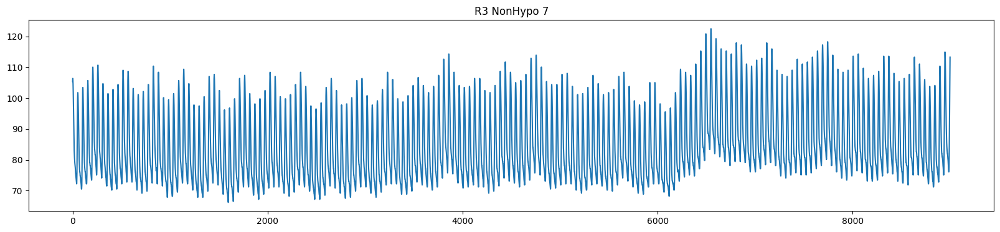

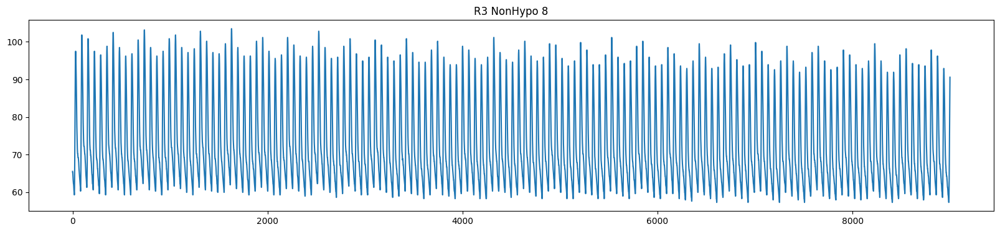

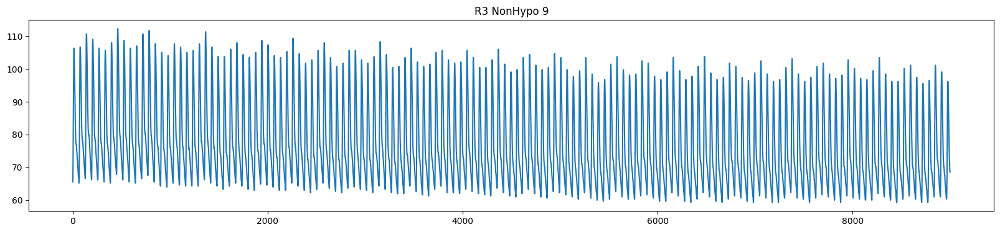

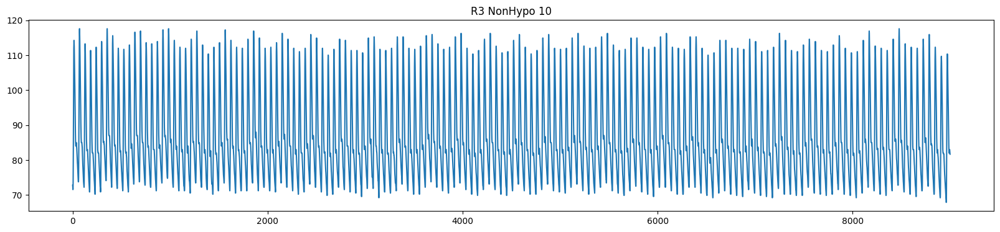

In [9]:
clean_tar_indices_r1 = [i for i, label in enumerate(r1Ylabel2) if label == 'CleanTar' and r1Xlabel[i] == 'NoiseInp']
clean_tar_indices_r2 = [i for i, label in enumerate(r2Ylabel2) if label == 'CleanTar' and r2Xlabel[i] == 'NoiseInp']
clean_tar_indices_r3 = [i for i, label in enumerate(r3Ylabel2) if label == 'CleanTar' and r3Xlabel[i] == 'NoiseInp']

hypo_indices_r1 = [i for i in clean_tar_indices_r1 if r1Ylabel[i] == 'Hypo'][:10]
nonhypo_indices_r1 = [i for i in clean_tar_indices_r1 if r1Ylabel[i] == 'NonHypo'][:10]

hypo_indices_r2 = [i for i in clean_tar_indices_r2 if r2Ylabel[i] == 'Hypo'][:10]
nonhypo_indices_r2 = [i for i in clean_tar_indices_r2 if r2Ylabel[i] == 'NonHypo'][:10]

hypo_indices_r3 = [i for i in clean_tar_indices_r3 if r3Ylabel[i] == 'Hypo'][:10]
nonhypo_indices_r3 = [i for i in clean_tar_indices_r3 if r3Ylabel[i] == 'NonHypo'][:10]


def plot_individual_graphs(Xinput, indices, state_label, set_label):
    for i, index in enumerate(indices):
        plt.figure(figsize=(20, 4))
        plt.plot(Xinput[index])
        plt.title(f'{set_label} {state_label} {i+1}')
        plt.show()

plot_individual_graphs(r1Xinput, hypo_indices_r1, 'Hypo', 'R1')
plot_individual_graphs(r1Xinput, nonhypo_indices_r1, 'NonHypo', 'R1')

plot_individual_graphs(r2Xinput, hypo_indices_r2, 'Hypo', 'R2')
plot_individual_graphs(r2Xinput, nonhypo_indices_r2, 'NonHypo', 'R2')

plot_individual_graphs(r3Xinput, hypo_indices_r3, 'Hypo', 'R3')
plot_individual_graphs(r3Xinput, nonhypo_indices_r3, 'NonHypo', 'R3')